In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import matplotlib as mpl
from astropy import units
from astropy import constants as const
from matplotlib.patches import Rectangle
from matplotlib.animation import FuncAnimation
from  IPython.display import HTML
from scipy.optimize import curve_fit
from scipy.special import wofz
from scipy.interpolate import interp1d
import matplotlib.colors as mcolors


mpl.rcParams['font.size'] = 14
mpl.rcParams['image.cmap']="Greys_r" 
mpl.rcParams['image.origin']= "lower"

In [2]:
sst4 = h5py.File("/mn/stornext/d19/RoCS/svenwe/lecture/AST5770/data/obssun_sst4/obssun_sst4.h5", "r")
intensity = sst4["intensity"][:]
wavelength = sst4["wavelength"][:]
time = sst4["time"][:]
time_s = sst4["time_s"][:]
x = sst4["x"][:]
y = sst4["y"][:]
c = const.c

In [ ]:
# finding central wavelength of Fe I line
FeI = np.mean(wavelength)
thr = 1e-3
search = np.logical_and(wavelength > FeI - thr, wavelength < FeI + thr)
line_core_idx = np.where(search == True)[0][0]
central_lmbda = wavelength[line_core_idx]
print(f"Line core index: {line_core_idx}")
print(f"Central wavelength of Fe I line: {central_lmbda} nm")

Line core index: 7
Central wavelength of Fe I line: 617.3367919921875 nm


In [4]:
subfield_1 = sst4["intensity"][:, :, 394:481, 394:481]
x_subfield_1 = sst4["x"][394:481]; y_subfield_1 = sst4["y"][394:481]
subfield_2 = sst4["intensity"][:, :, 118:204, 118:204]
x_subfield_2 = sst4["x"][118:204]; y_subfield_2 = sst4["y"][118:204]

xy_1_min = 394; xy_1_max = 481
xy_2_min = 118; xy_2_max =  204

<>:4: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_515031/1772910574.py:4: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle(f"$\lambda$ = {central_lmbda: .2f} nm, t = {time_s[frame]: .3f} s")


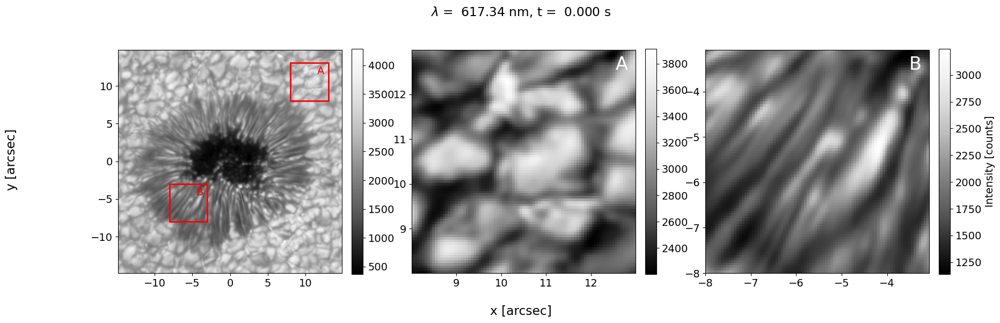

In [5]:
#for frame in range(time.size):
for frame in range(1):
    fig, ax = plt.subplots(1, 3, figsize = (20, 6))
    fig.suptitle(f"$\lambda$ = {central_lmbda: .2f} nm, t = {time_s[frame]: .3f} s")
    fig.supxlabel("x [arcsec]"); fig.supylabel("y [arcsec]")

    im_fov = ax[0].imshow(intensity[frame, line_core_idx, :, :], origin="lower", extent = [np.min(x), np.max(x), np.min(y), np.max(y)])
    fig.colorbar(im_fov, ax=ax[0], fraction=0.046, pad=0.04)
    
    ax[0].add_patch(Rectangle((sst4["x"][xy_1_min], sst4["y"][xy_1_min]), sst4["x"][xy_1_max]- sst4["x"][xy_1_min], sst4["y"][xy_1_max]- sst4["y"][xy_1_min], fill=None, edgecolor="red", linewidth=2))
    ax[0].add_patch(Rectangle((sst4["x"][xy_2_min], sst4["y"][xy_2_min]), sst4["x"][xy_2_max]- sst4["x"][xy_2_min], sst4["y"][xy_2_max]- sst4["y"][xy_2_min], fill=None, edgecolor="red", linewidth=2))
    ax[0].text(sst4["x"][xy_1_max] - 1.5, sst4["y"][xy_1_max] - 1.5, "A", color="red", fontsize = 14)
    ax[0].text(sst4["x"][xy_2_max] - 1.5, sst4["y"][xy_2_max] - 1.5, "B", color="red", fontsize = 14)

    A = ax[1].imshow(subfield_1[frame, line_core_idx], origin="lower", extent = [np.min(x_subfield_1), np.max(x_subfield_1), np.min(y_subfield_1), np.max(y_subfield_1)])
    fig.colorbar(A, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].text(sst4["x"][xy_1_max] - .5, sst4["y"][xy_1_max] - .5, "A", color="white", fontsize = 24)

    B = ax[2].imshow(subfield_2[frame, line_core_idx], origin="lower", extent = [np.min(x_subfield_2), np.max(x_subfield_2), np.min(y_subfield_2), np.max(y_subfield_2)])
    fig.colorbar(B, ax=ax[2], label="Intensity [counts]", fraction=0.046, pad=0.04)
    ax[2].text(sst4["x"][xy_2_max] - .5, sst4["y"][xy_2_max] - .5, "B", color="white", fontsize = 24)

    #plt.savefig(f"figure/intensity_subfields/intensity_{frame:04d}.png")

In [6]:
# Define the Voigt profile function
def _voigt(x, amplitude, center, sigma, gamma, background):
    z = ((x - center) + 1j * gamma) / (sigma * np.sqrt(2))
    return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background

## TEST ONE CASE BEFORE GENERALIZING

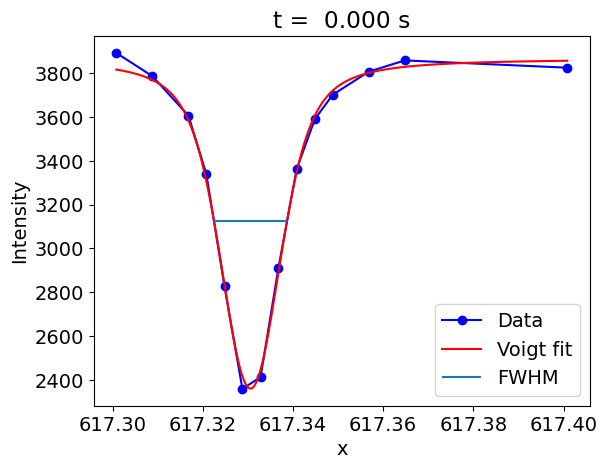

No FWHM found at t[1]


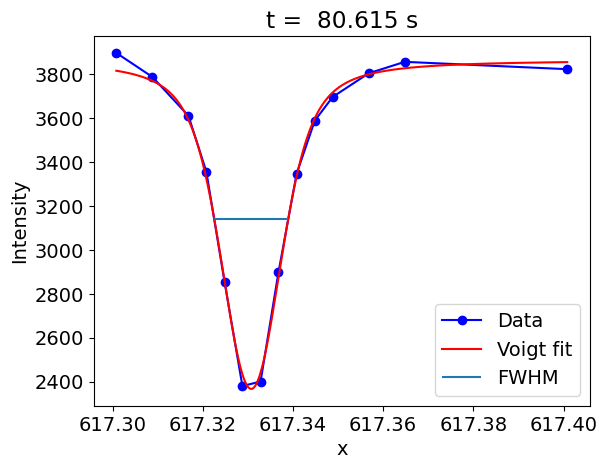

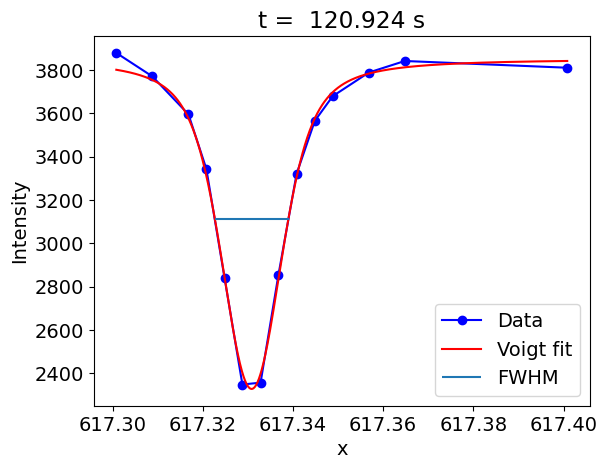

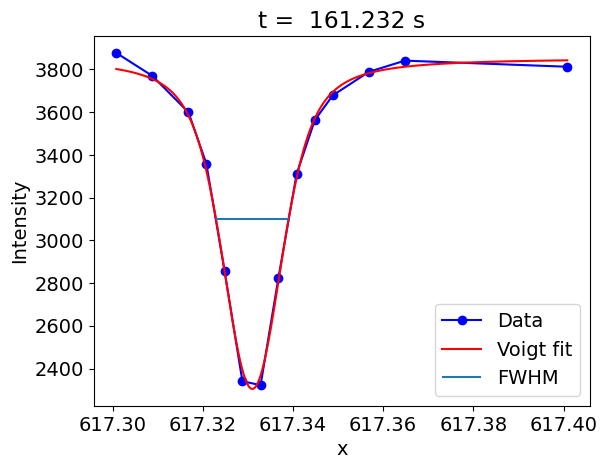

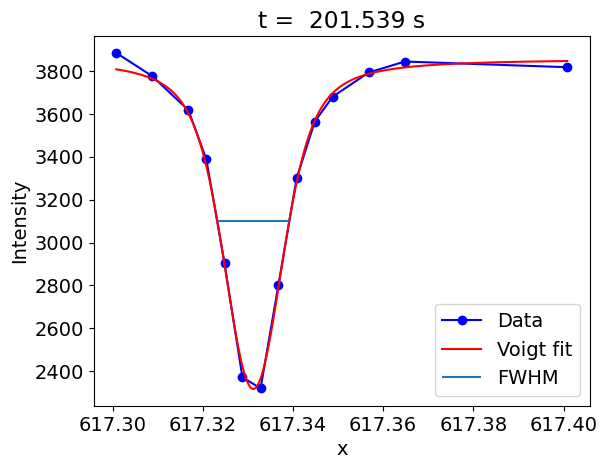

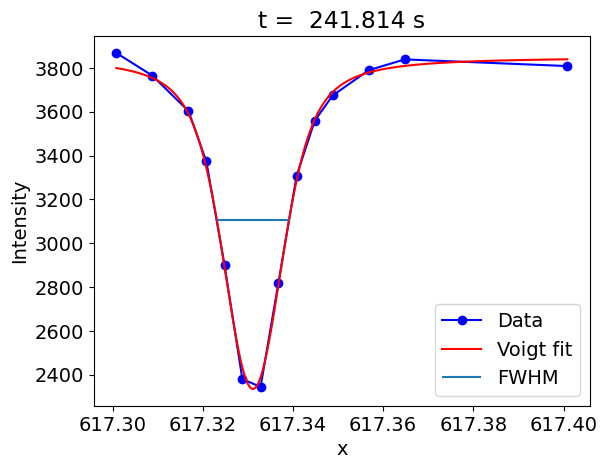

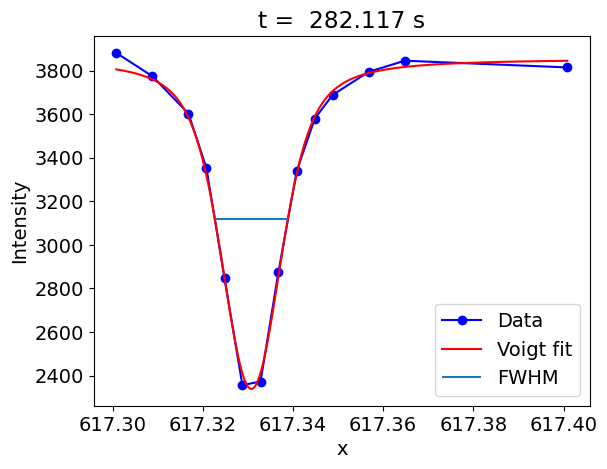

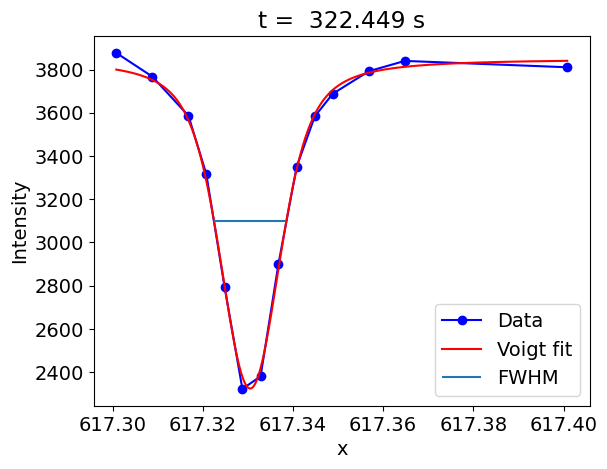

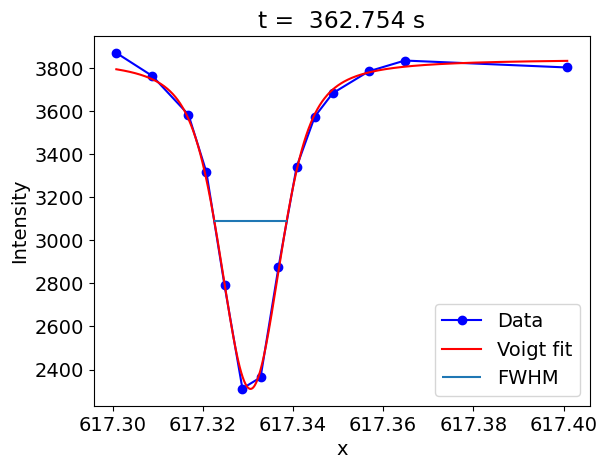

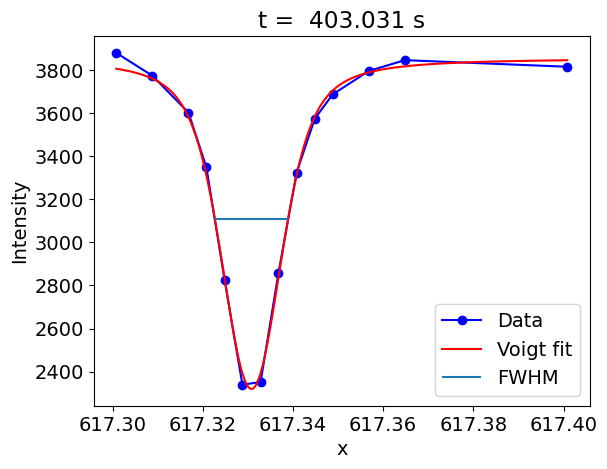

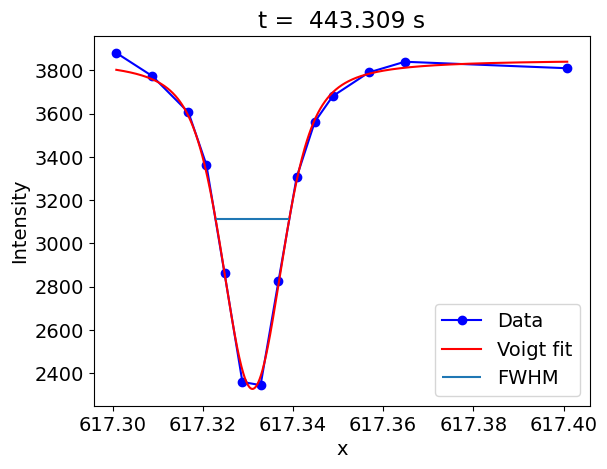

/tmp/ipykernel_515031/2255937726.py:4: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background
/tmp/ipykernel_515031/2255937726.py:4: RuntimeWarning: overflow encountered in divide
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background


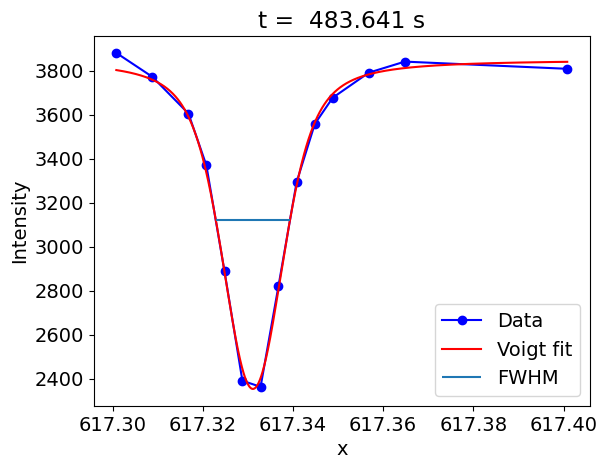

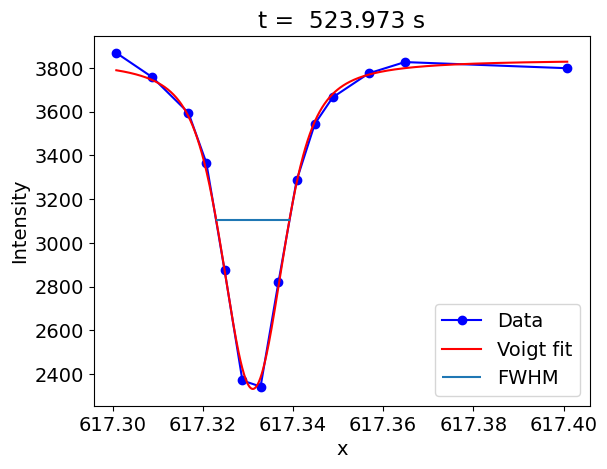

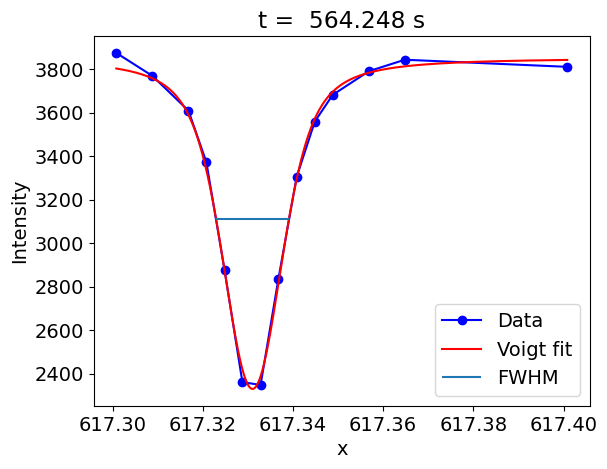

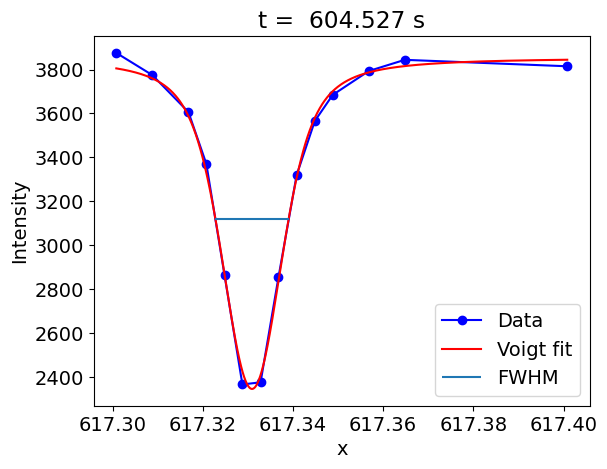

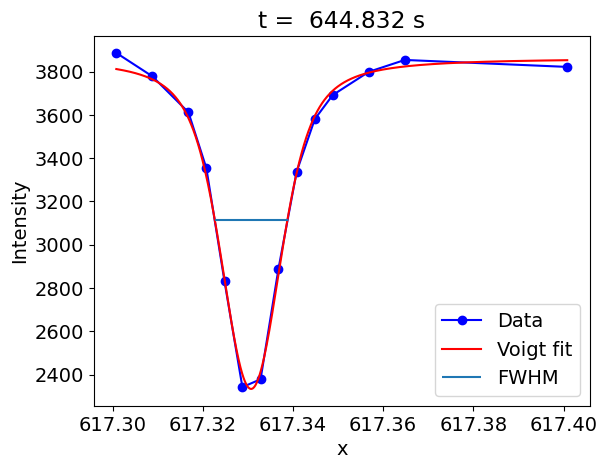

...

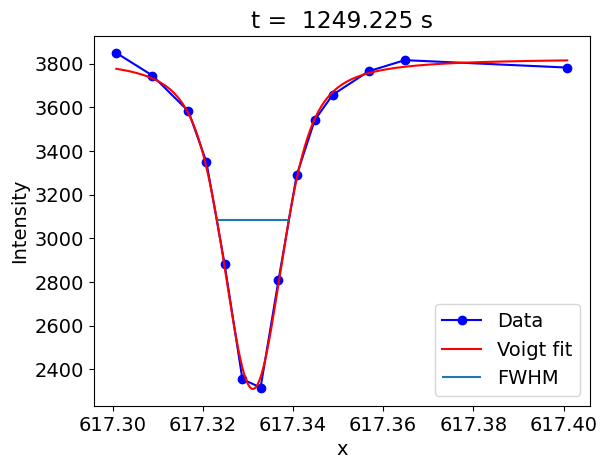

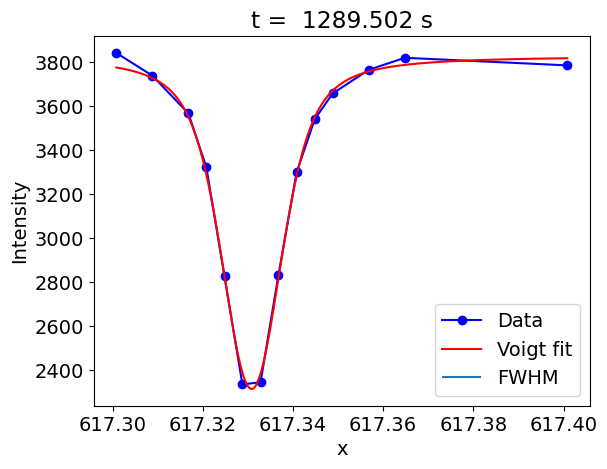

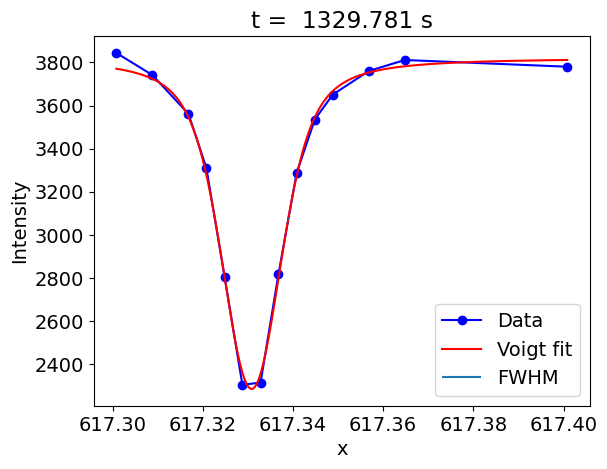

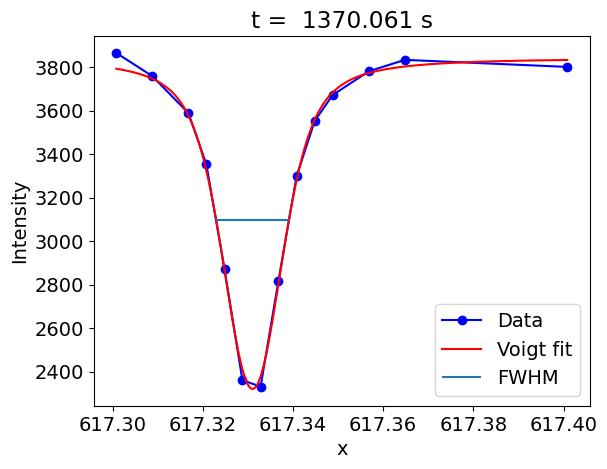

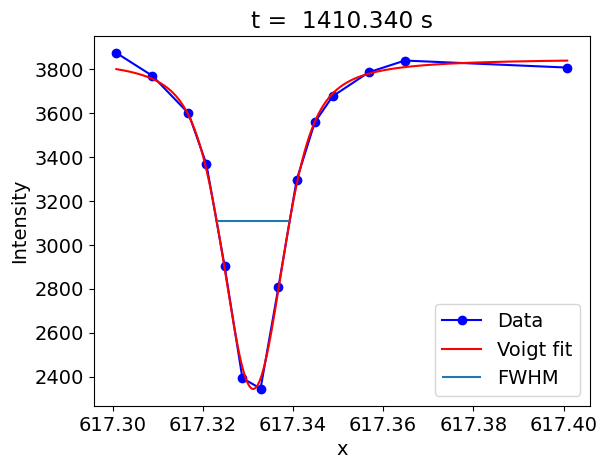

No FWHM found at t[36]


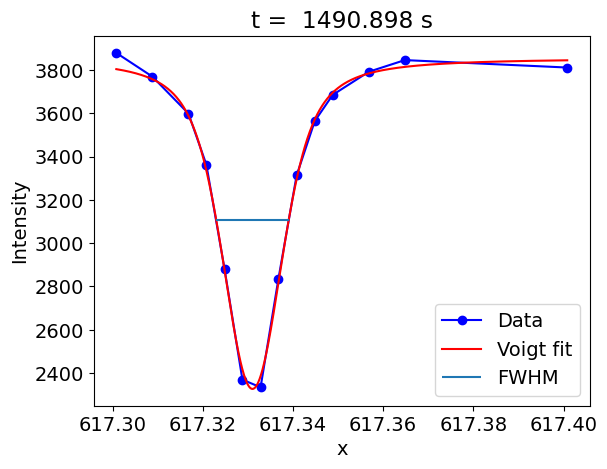

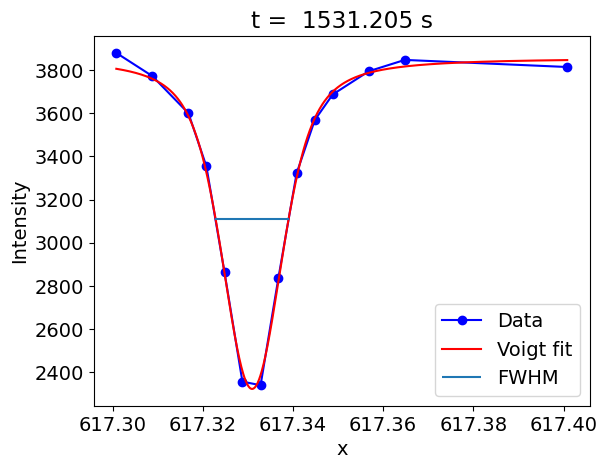

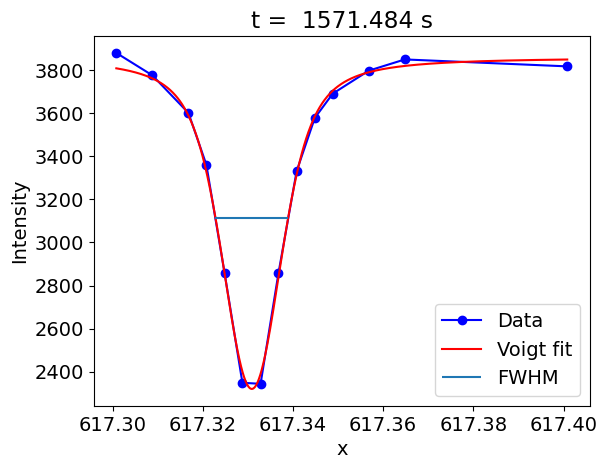

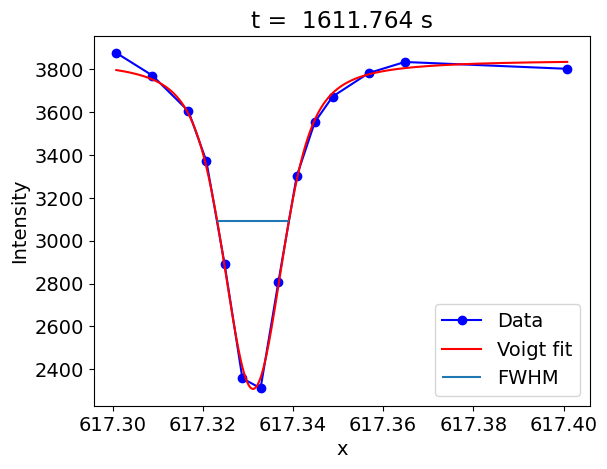

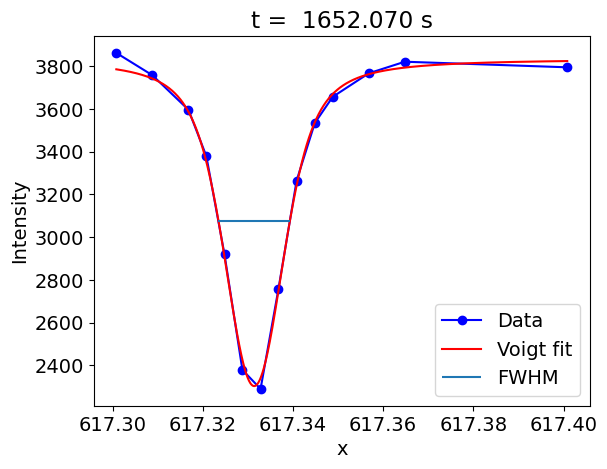

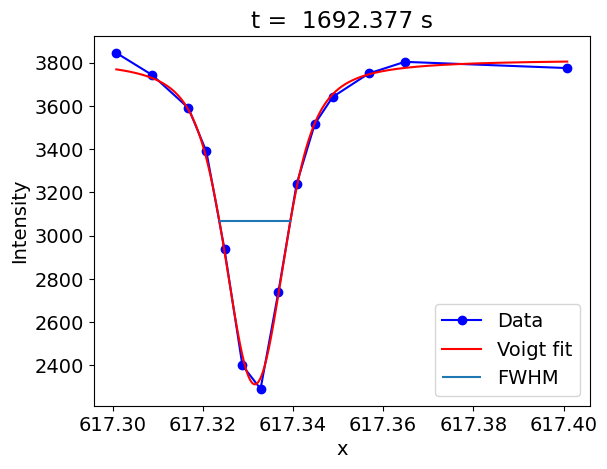

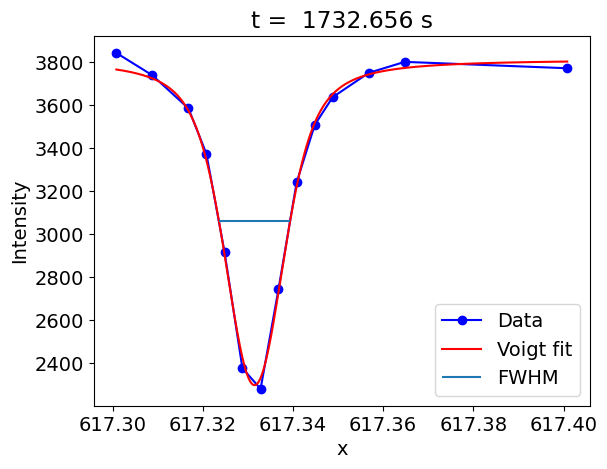

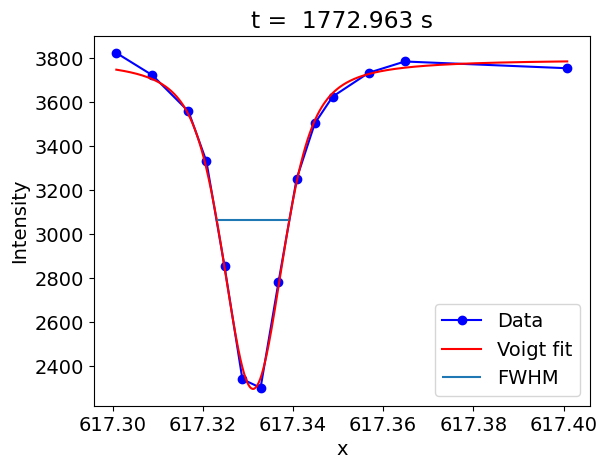

No FWHM found at t[45]


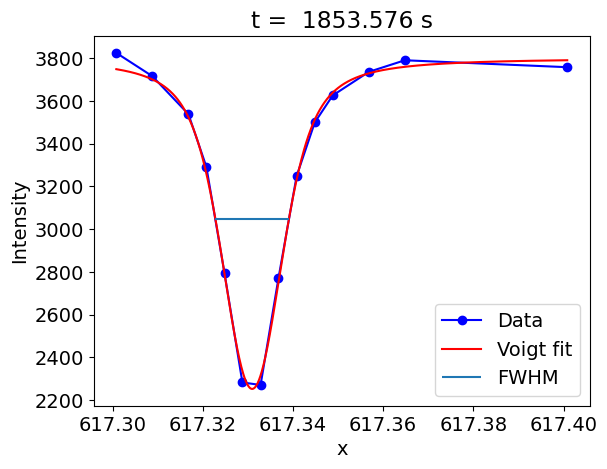

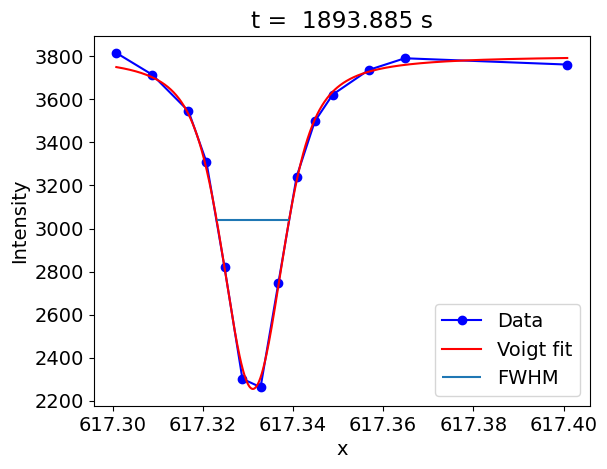

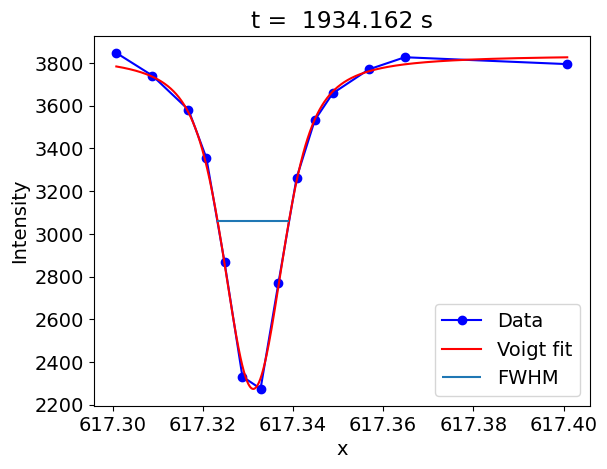

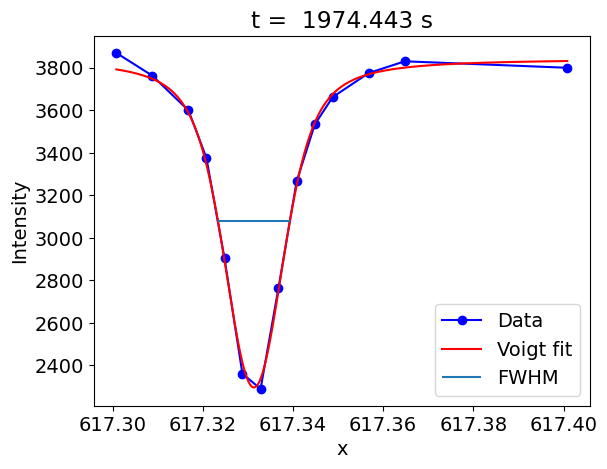

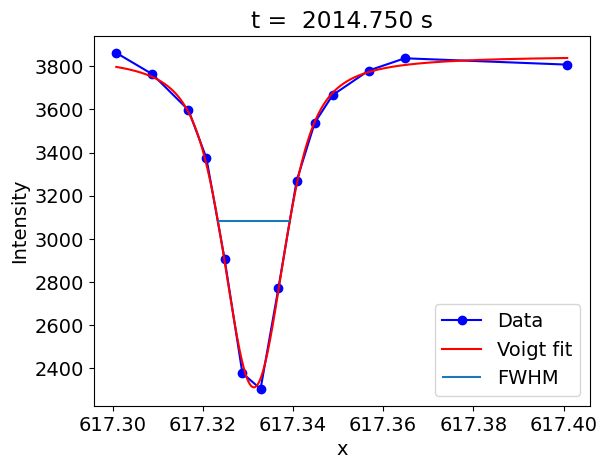

...

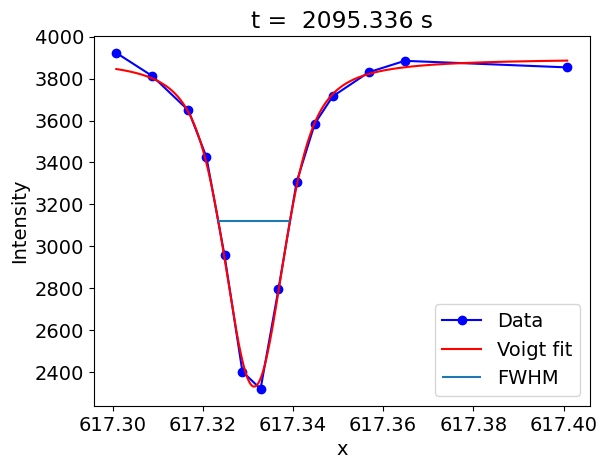

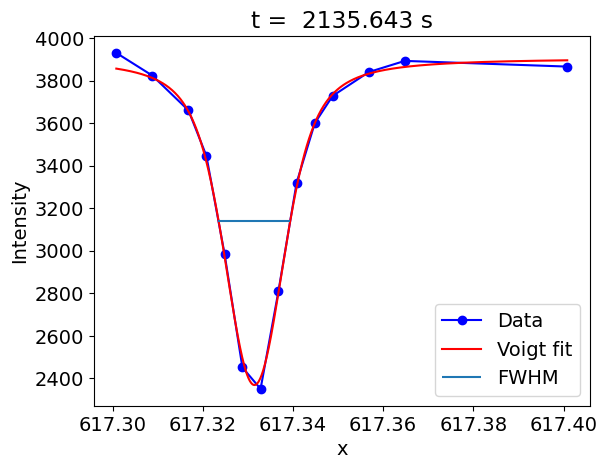

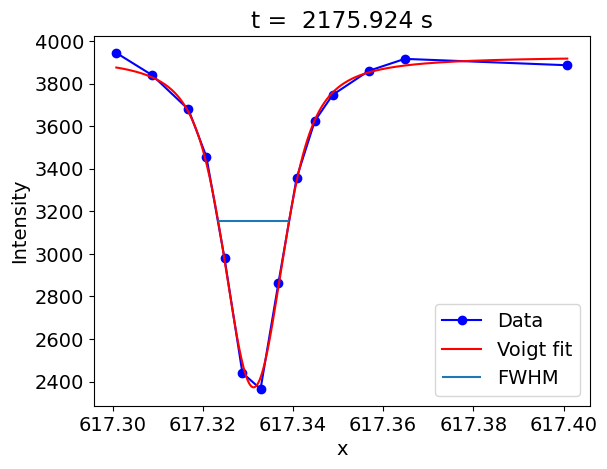

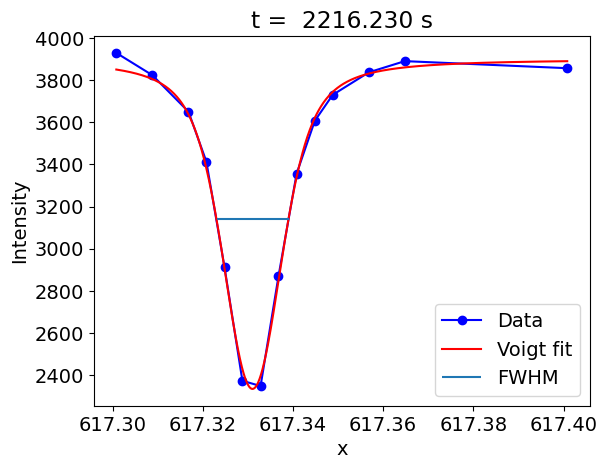

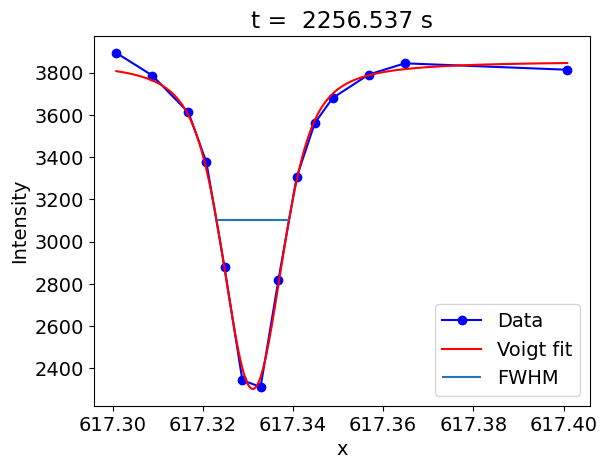

In [12]:
x_data = wavelength
# Define new x values for interpolation (more densely spaced)
nump = 1000
x_interpolated = np.linspace(x_data.min(), x_data.max(), nump)
spat_avg_intensity = np.zeros((time.size, nump))
for t in range(time.size):
    y_data = np.average(subfield_1[t, :], axis = (1, 2))

    # Create the interpolator using linear interpolation
    interpolator = interp1d(x_data, y_data, kind='linear')

    # Use the interpolator to compute y values at new x points
    y_interpolated = interpolator(x_interpolated)

    # Parameters for curve fit
    background_level_guess = np.max(y_data)                             # Baseline level
    amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
    mean_guess = np.mean(wavelength)                                               # Center of the dip
    gamm_guess = 0          # Width of the Lorentzian component

    # Find FWHM
    peak_max = np.max(y_data) - np.min(y_data)
    half_max = peak_max / 2 + np.min(y_data)
    thr = 7
    indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
    search = np.where(indices == True)[0]
    if search.size < 2:
        print(f"No FWHM found at t[{t}]")
        continue
    fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
    sigma_guess =  fwhm       # Width of the Gaussian component

    # Initial guesses for curve fitting parameters
    initial_guesses = [amplitude_guess, mean_guess, sigma_guess, gamm_guess, background_level_guess]

    # Fit the Voigt profile
    popt, pcov = curve_fit(_voigt, x_interpolated, y_interpolated, p0=initial_guesses, maxfev=5000)
    spat_avg_intensity[t] = _voigt(x_interpolated, *popt)

    # Plotting the original data and the fitted Voigt profile
    plt.plot(x_data, y_data, 'bo-', label='Data')
    plt.plot(x_interpolated, _voigt(x_interpolated, *popt), 'r-', label='Voigt fit')
    plt.hlines(half_max, x_interpolated[search[0]], x_interpolated[search[-1]], label = "FWHM")
    plt.xlabel('x')
    plt.ylabel('Intensity')
    plt.title(f't = {time_s[t]: .3f} s')

    plt.legend()
    plt.show()

## Inspecting thr limit

3033.5204122076893 3063.5204122076893
[218 219 381 382 383]
617.32263 617.3392


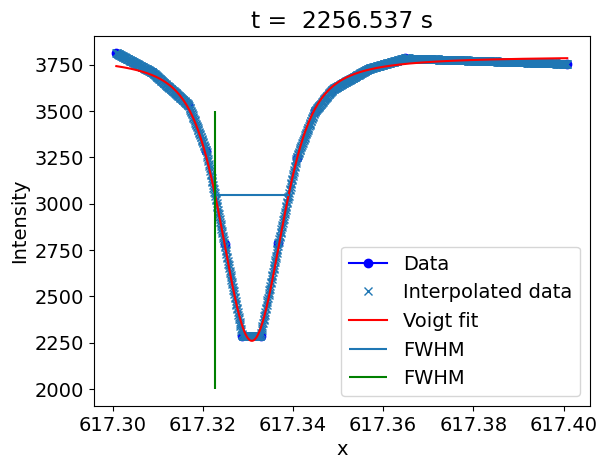

In [40]:
x_data = wavelength
# Define new x values for interpolation (more densely spaced)
nump = 1000
x_interpolated = np.linspace(x_data.min(), x_data.max(), nump)


y_data = np.average(subfield_1[45, :], axis = (1, 2))

    # Create the interpolator using linear interpolation
interpolator = interp1d(x_data, y_data, kind='linear')

    # Use the interpolator to compute y values at new x points
y_interpolated = interpolator(x_interpolated)

    # Parameters for curve fit
background_level_guess = np.max(y_data)                             # Baseline level
amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
mean_guess = np.mean(wavelength)                                               # Center of the dip
gamm_guess = 0          # Width of the Lorentzian component

    # Find FWHM
peak_max = np.max(y_data) - np.min(y_data)
half_max = peak_max / 2 + np.min(y_data)
thr = 15
indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
print(half_max - thr, half_max + thr)
search = np.where(indices == True)[0]
print(search)
if search.size < 2:
    print(f"No FWHM found")
fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
sigma_guess =  fwhm       # Width of the Gaussian component

    # Initial guesses for curve fitting parameters
initial_guesses = [amplitude_guess, mean_guess, sigma_guess, gamm_guess, background_level_guess]

    # Fit the Voigt profile
popt, pcov = curve_fit(_voigt, x_interpolated, y_interpolated, p0=initial_guesses, maxfev=5000)

    # Plotting the original data and the fitted Voigt profile
plt.plot(x_data, y_data, 'bo-', label='Data')
plt.plot(x_interpolated, y_interpolated, 'x', label='Interpolated data')
plt.plot(x_interpolated, _voigt(x_interpolated, *popt), 'r-', label='Voigt fit')
plt.hlines(half_max, x_interpolated[search[0]], x_interpolated[search[-1]], label = "FWHM")
plt.xlabel('x')
plt.ylabel('Intensity')
plt.title(f't = {time_s[t]: .3f} s')
plt.vlines(x_interpolated[search[0]], 2000, 3500, color="green", label="FWHM")
print(x_interpolated[search[0]], x_interpolated[search[-1]])

# plt.ylim(3000, 3100)
# plt.ylim(x_interpolated[search[0] - 0.02], x_interpolated[search[-1] + 0.02])

plt.legend()
plt.show()

## FUNCTION FOR FITTING A VOIGT PROFILE

In [13]:
def _fit_voigt(x_data, y_data, nump, thr):
    # Create the interpolator using linear interpolation
    interpolator = interp1d(x_data, y_data, kind='linear')

    # Use the interpolator to compute y values at new x points
    x_interpolated = np.linspace(x_data.min(), x_data.max(), nump)
    y_interpolated = interpolator(x_interpolated)

    # Parameters for curve fit
    background_level_guess = np.max(y_data)                             # Baseline level
    amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
    mean_guess = np.mean(wavelength)                                               # Center of the dip

    # Find FWHM
    peak_max = np.max(y_data) - np.min(y_data)
    half_max = peak_max / 2 + np.min(y_data)
    indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
    search = np.where(indices == True)[0]
    if search.size < 2:
        print("No FWHM found")
    fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
    sigma_guess =  fwhm       # Width of the Gaussian component
    gamm_guess = sigma_guess          # Width of the Lorentzian component

    # Initial guesses for curve fitting parameters
    initial_guesses = [amplitude_guess, mean_guess, sigma_guess, gamm_guess, background_level_guess]

    # Fit the Voigt profile
    popt, pcov = curve_fit(_voigt, x_interpolated, y_interpolated, p0=initial_guesses, maxfev=5000)
    return x_interpolated, _voigt(x_interpolated, *popt)

## DOPPLER MAP WITH VOIGT PROFILE FITTED TO THE SPATIALLY AVERAGE INTENSITY PROFILE

In [8]:
avg_intensity = spat_avg_intensity[0]
idx = np.argmin(avg_intensity)
lambda0 = x_interpolated[idx]

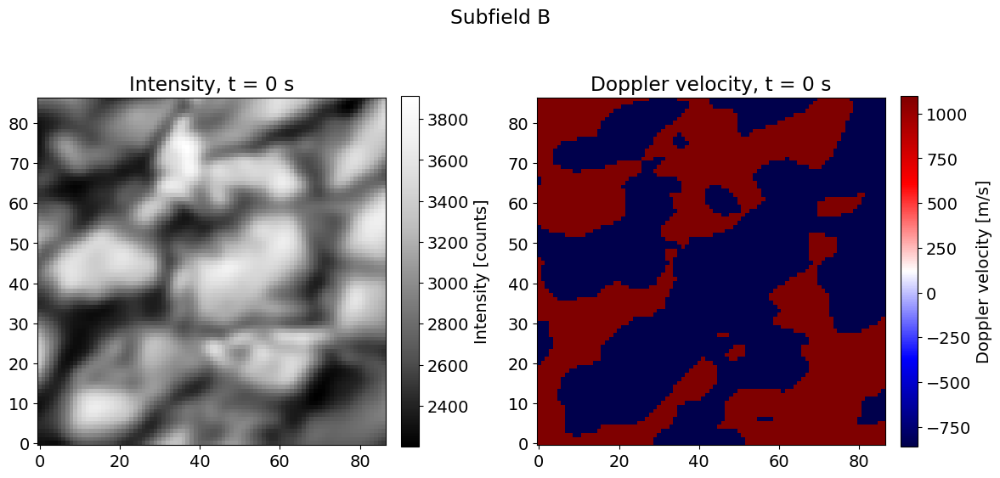

In [15]:
time_step = 0
fig, ax = plt.subplots(1, 2, figsize = (12, 6))
intensity_A_im = ax[0].imshow(subfield_1[time_step, line_core_idx], origin="lower")
fig.colorbar(intensity_A_im, ax=ax[0], label="Intensity [counts]", fraction=0.046, pad=0.04)

cube = np.zeros((subfield_1.shape[2], subfield_1.shape[3]))
for x in range(subfield_1.shape[3]):
    for y in range(subfield_1.shape[2]):
        pixel_intensity = subfield_1[time_step, :, y, x]
        val = np.argmin(pixel_intensity)
        delta_lambda = wavelength[val]*units.nm - lambda0*units.nm
        v = delta_lambda.to(units.m) / (lambda0*units.nm).to(units.m) * c
        cube[y, x] = v.value

im = ax[1].imshow(cube, origin="lower", cmap = "seismic")
fig.colorbar(im, ax=ax[1], label="Doppler velocity [m/s]", fraction=0.046, pad=0.04)

fig.suptitle("Subfield B")
ax[0].set_title("Intensity, t = 0 s")
ax[1].set_title("Doppler velocity, t = 0 s")
plt.tight_layout()

## DOPPLER MAP WITH VOIGT PROFILE FITTED TO THE SPATIALLY AVERAGE INTENSITY PROFILE AND PIXEL INTENSITY

In [16]:
# ideal case
for x_idx in range(subfield_1.shape[3]):
    for y_idx in range(subfield_1.shape[2]):
        print(f"Processing pixel ({x_idx}, {y_idx})")
        pixel_intensity = subfield_1[time_step, :, y_idx, x_idx]
        x_voigt, y_voigt = _fit_voigt(wavelength, pixel_intensity, nump, thr = 20)
        print(np.min(y_voigt))

Processing pixel (0, 0)
1995.4526967466545
Processing pixel (0, 1)
2018.7337662874934
Processing pixel (0, 2)
2070.044868662444
Processing pixel (0, 3)
2143.180196790744
Processing pixel (0, 4)
2208.6885307641624
Processing pixel (0, 5)
2237.672381913412
Processing pixel (0, 6)
2223.1366570658
Processing pixel (0, 7)
2180.0204010948755
Processing pixel (0, 8)
2138.029517435487
Processing pixel (0, 9)
2118.865997675752
Processing pixel (0, 10)
2125.936475118198
Processing pixel (0, 11)
2150.307975653407
Processing pixel (0, 12)
2180.613297677679
Processing pixel (0, 13)


/tmp/ipykernel_3757786/2255937726.py:4: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background
/tmp/ipykernel_3757786/2255937726.py:4: RuntimeWarning: overflow encountered in divide
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background


2212.077070867448
Processing pixel (0, 14)
2245.329234363562
Processing pixel (0, 15)
2285.91260289401
Processing pixel (0, 16)
2333.8799026122
Processing pixel (0, 17)
2384.3087603074814
Processing pixel (0, 18)
2429.796574460158
Processing pixel (0, 19)
2464.5672440725193
Processing pixel (0, 20)
2484.9878064284167
Processing pixel (0, 21)
2491.240233837877
Processing pixel (0, 22)
2484.27693788097
Processing pixel (0, 23)
2464.4167864403703
Processing pixel (0, 24)
2429.4085377229503
Processing pixel (0, 25)
2380.244201255623
Processing pixel (0, 26)
2322.3636163947463
Processing pixel (0, 27)
2263.555240378545
Processing pixel (0, 28)
2206.174583532623
Processing pixel (0, 29)
2150.197912631662
Processing pixel (0, 30)
2097.6006921880335
Processing pixel (0, 31)
2051.6351556256413
Processing pixel (0, 32)
2021.2057307896334
Processing pixel (0, 33)
2014.0991318075949
Processing pixel (0, 34)
2031.952386671271
Processing pixel (0, 35)
2072.8550270261985
Processing pixel (0, 36)
2130

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.

## Assessing issue with curve_fit using Voigt

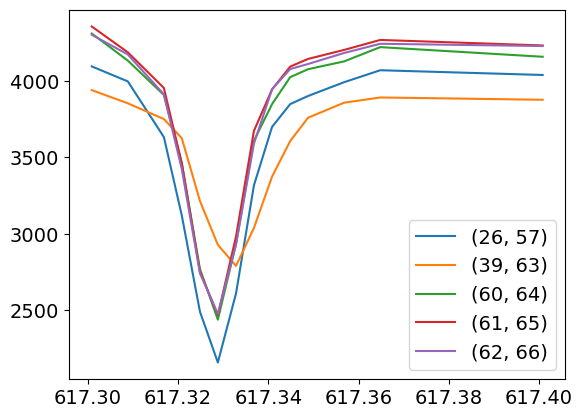

In [ ]:
xs = [26, 39, 60, 61, 62]
ys = [57, 63, 64, 65, 66]
# plt.plot(wavelength, subfield_1[time_step, :, 20, 50], label = "(20, 50)")
# plt.plot(wavelength, subfield_1[time_step, :, 25, 56], label = "(20, 50)")
for i in range(len(xs)):
    test_field = subfield_1[time_step, :, ys[i], xs[i]]
    plt.plot(wavelength, test_field, label =f"({xs[i]}, {ys[i]})")

    #x_voigt, y_voigt = _fit_voigt(wavelength, test_field, 1000, 20)
    #plt.plot(x_voigt, y_voigt)  
plt.legend()

## Attempt fitting a Gaussian curve rather than Voigt

In [9]:
def _gaussian(x, amplitude, mean, sigma, background):
    return amplitude * np.exp(-((x - mean) ** 2) / (2 * sigma ** 2)) + background

In [10]:
x_data = wavelength
# Define new x values for interpolation (more densely spaced)
nump = 1000
x_interpolated = np.linspace(x_data.min(), x_data.max(), nump)

for i in range(len(xs)):
    y_data = subfield_1[time_step, :, ys[i], xs[i]]

        # Create the interpolator using linear interpolation
    interpolator = interp1d(x_data, y_data, kind='linear')

        # Use the interpolator to compute y values at new x points
    y_interpolated = interpolator(x_interpolated)

        # Parameters for curve fit
    background_level_guess = np.max(y_data)                             # Baseline level
    amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
    mean_guess = np.mean(wavelength)                                               # Center of the dip
    gamm_guess = 0          # Width of the Lorentzian component

        # Find FWHM
    peak_max = np.max(y_data) - np.min(y_data)
    half_max = peak_max / 2 + np.min(y_data)
    thr = 10
    indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
    search = np.where(indices == True)[0]
    if search.size < 2:
        print("No FWHM found")
        
    fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
    sigma_guess =  fwhm       # Width of the Gaussian component


    # Fit the Gaussian profile
    initial_guesses = [amplitude_guess, mean_guess, sigma_guess, background_level_guess]
    popt, pcov = curve_fit(_gaussian, x_interpolated, y_interpolated, p0=initial_guesses, maxfev=5000)


        # Plotting the original data and the fitted Voigt profile
    plt.plot(x_data, y_data, 'bo-', label='Data')
    plt.plot(x_interpolated, _gaussian(x_interpolated, *popt), 'r-', label='Gaussian fit')
    plt.hlines(half_max, x_interpolated[search[0]], x_interpolated[search[-1]], label = "FWHM")
    plt.legend()
    plt.show()
    

NameError: name 'xs' is not defined

## Function for fitting Gaussian

In [11]:
def _fit_gaussian(x_data, y_data, nump, thr):
    # Create the interpolator using linear interpolation
    interpolator = interp1d(x_data, y_data, kind='linear')

    # Use the interpolator to compute y values at new x points
    x_interpolated = np.linspace(x_data.min(), x_data.max(), nump)
    y_interpolated = interpolator(x_interpolated)

    # Parameters for curve fit
    background_level_guess = np.max(y_data)                             # Baseline level
    amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
    mean_guess = np.mean(wavelength)                                               # Center of the dip

    # Find FWHM
    peak_max = np.max(y_data) - np.min(y_data)
    half_max = peak_max / 2 + np.min(y_data)
    indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
    search = np.where(indices == True)[0]
    if search.size < 2:
        print("No FWHM found")
    fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
    sigma_guess =  fwhm       # Width of the Gaussian component

    # Initial guesses for curve fitting parameters
    initial_guesses = [amplitude_guess, mean_guess, sigma_guess, background_level_guess]

    # Fit the Voigt profile
    popt, pcov = curve_fit(_gaussian, x_interpolated, y_interpolated, p0=initial_guesses, maxfev=5000)
    return x_interpolated, _gaussian(x_interpolated, *popt)

In [ ]:
for x_idx in range(subfield_1.shape[3]):
    for y_idx in range(subfield_1.shape[2]):
        #print(f"Processing pixel ({x_idx}, {y_idx})")
        pixel_intensity = subfield_1[time_step, :, y_idx, x_idx]
        x_gaussian, y_gaussian = _fit_gaussian(wavelength, pixel_intensity, nump, thr = 15)
        #print(np.min(y_gaussian))

Method works.

## DOPPLER MAP WITH VOIGT PROFILE FITTED TO THE SPATIALLY AVERAGE INTENSITY PROFILE AND PIXEL INTENSITY

### Spatially averaged intensity profile for subfield B, t = 0. Comparision between Voigt and Gaussian.

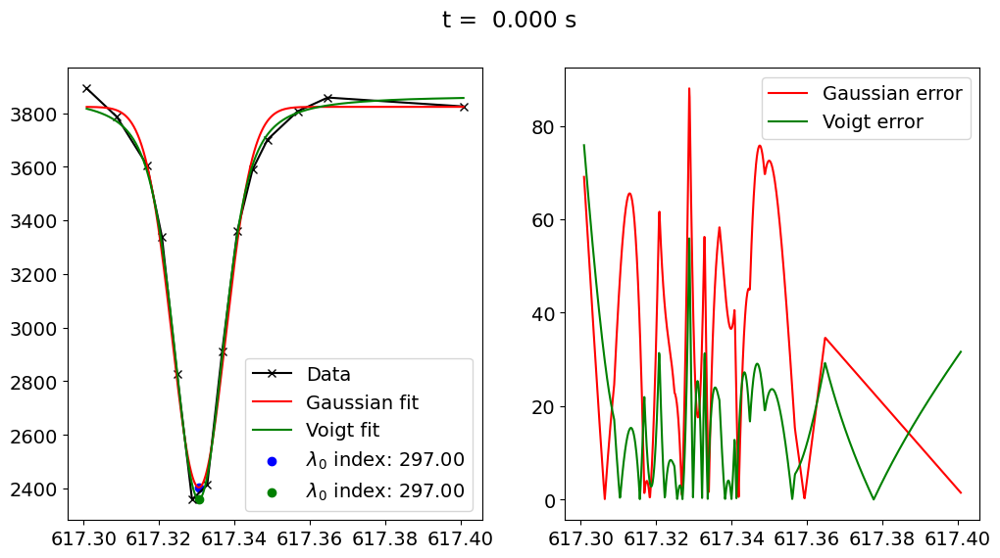

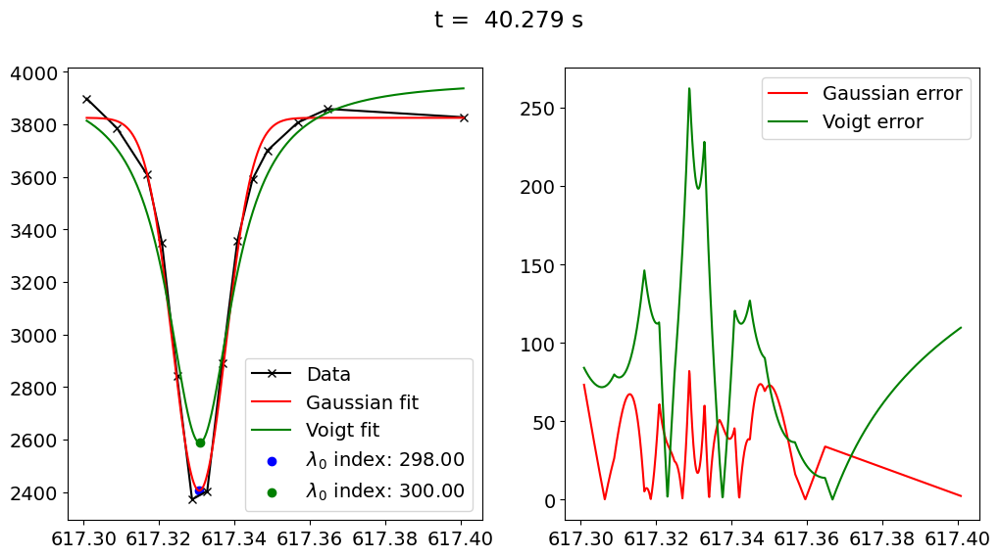

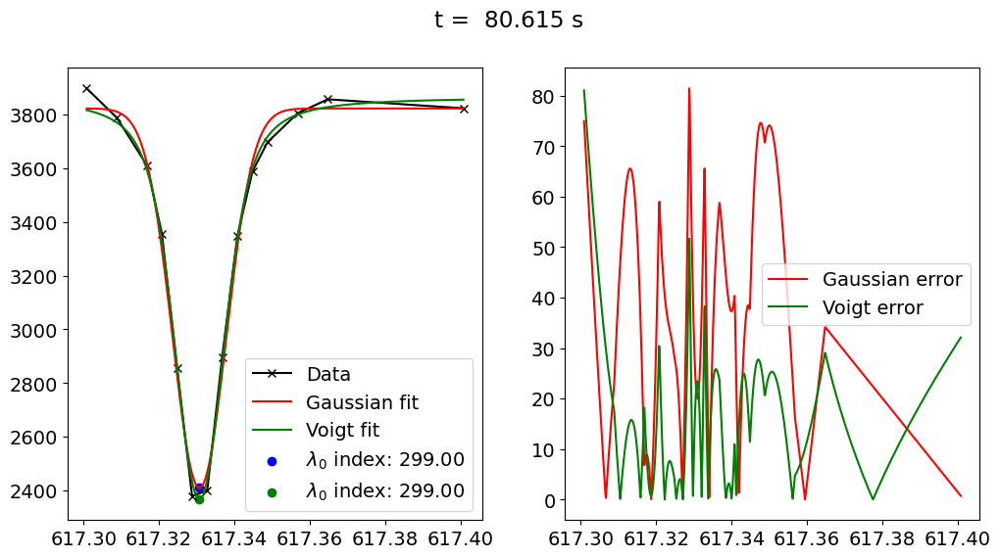

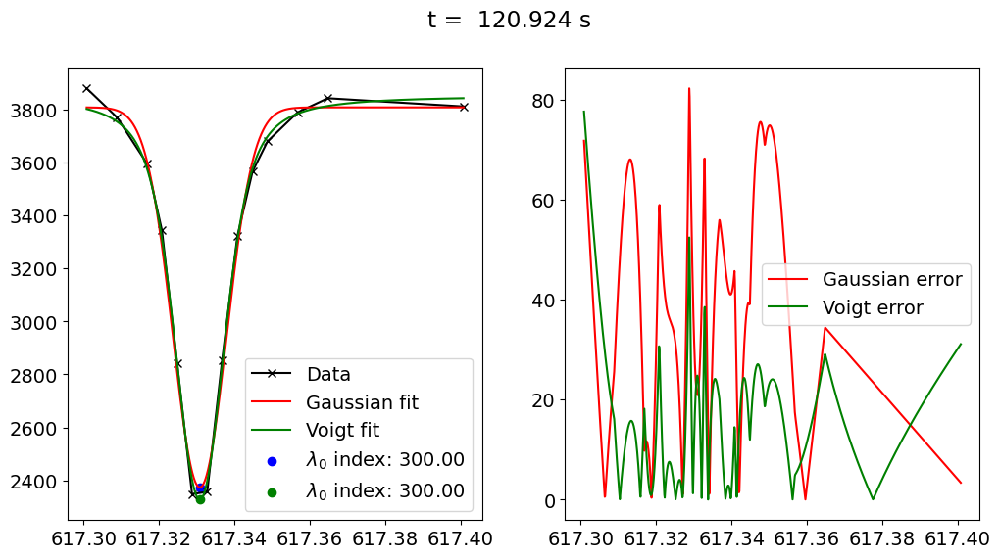

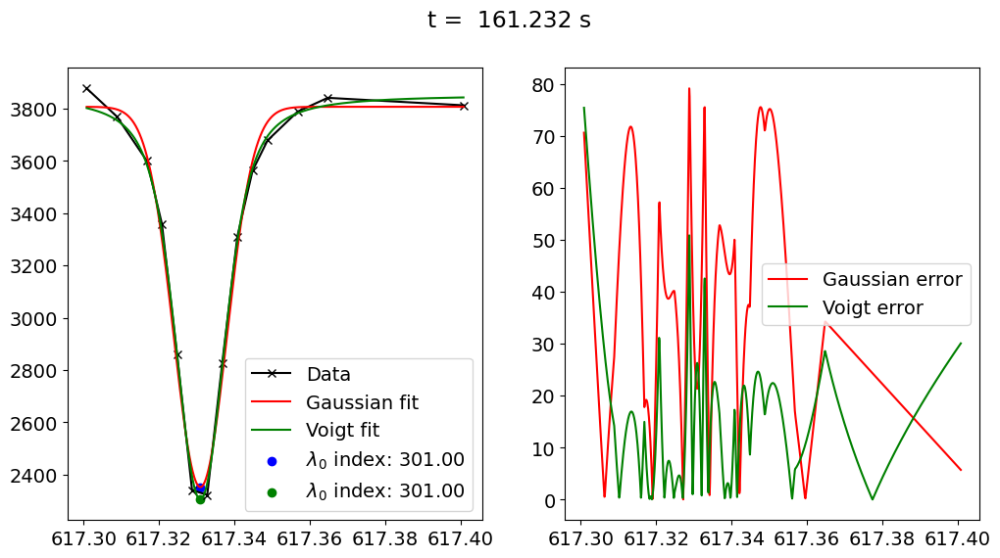

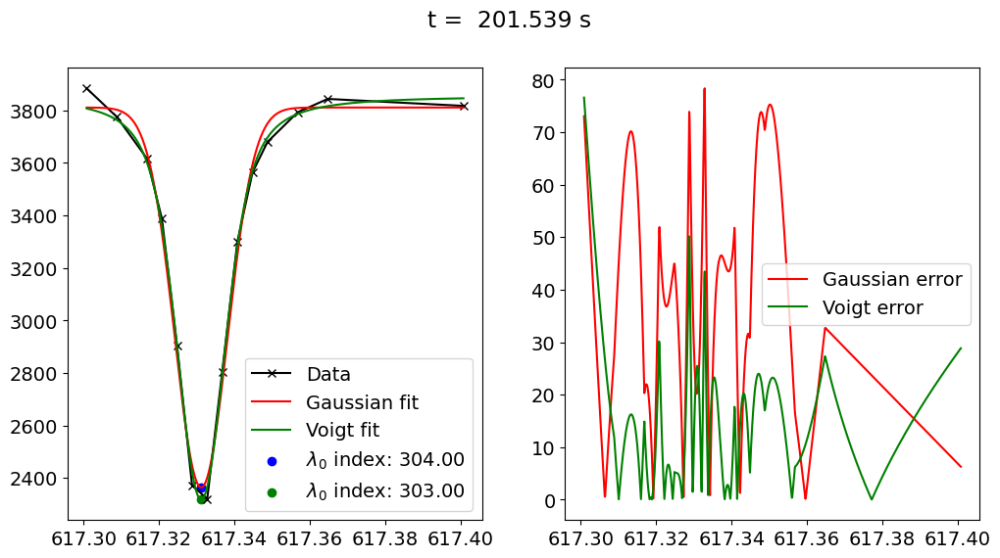

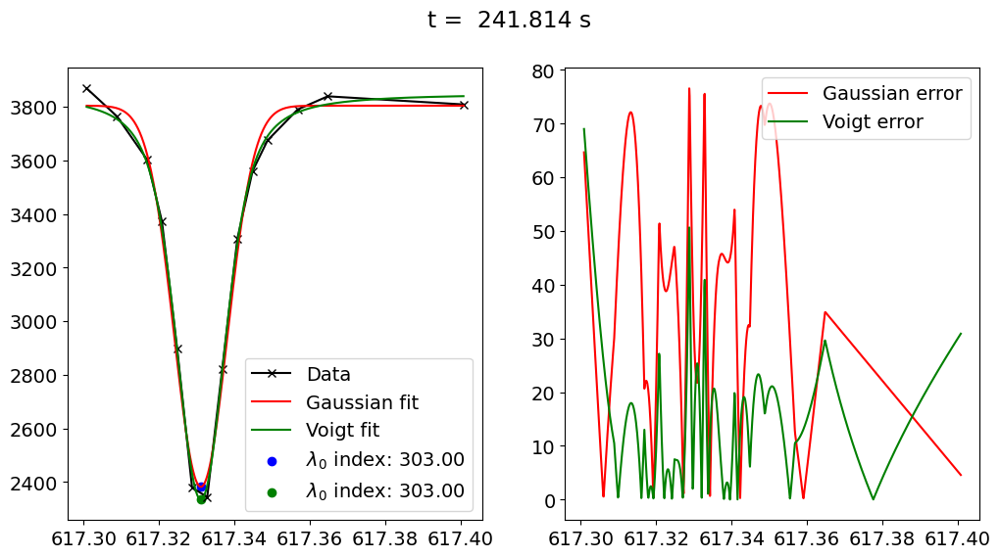

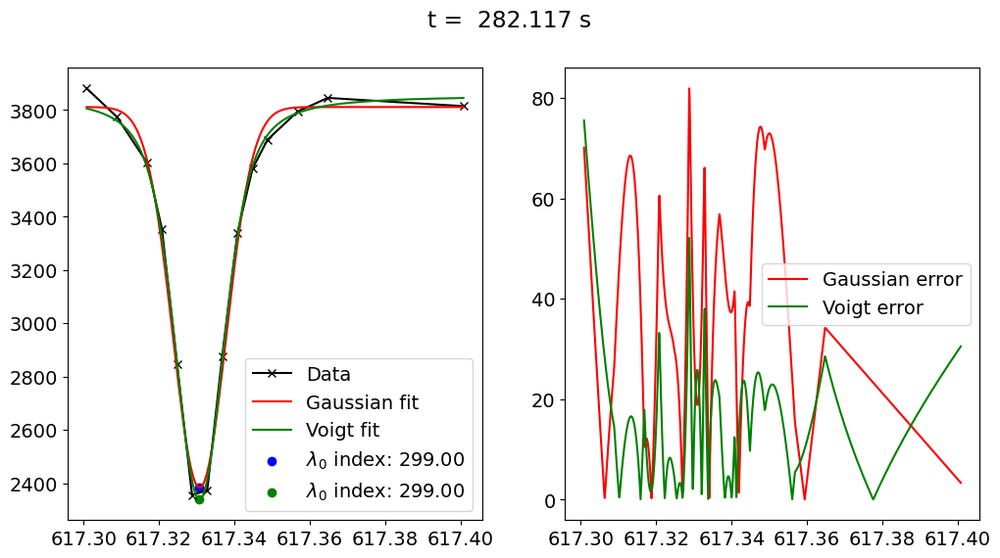

/tmp/ipykernel_4013085/2255937726.py:4: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background


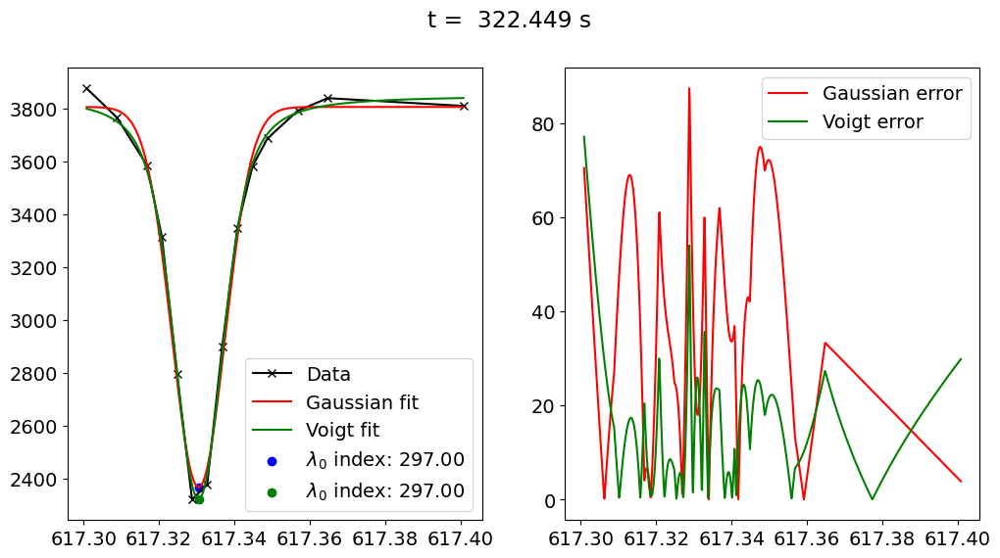

/tmp/ipykernel_4013085/2255937726.py:4: RuntimeWarning: overflow encountered in divide
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background


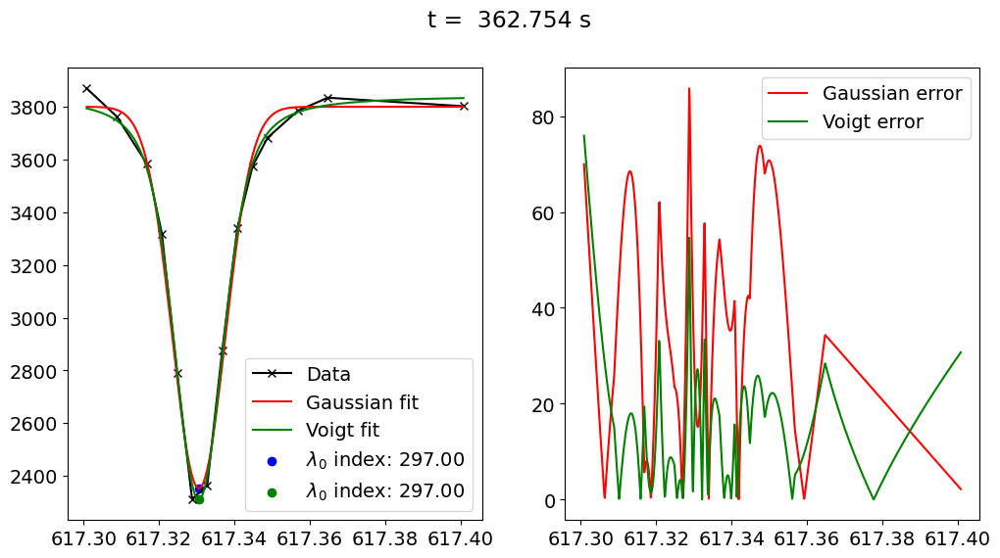

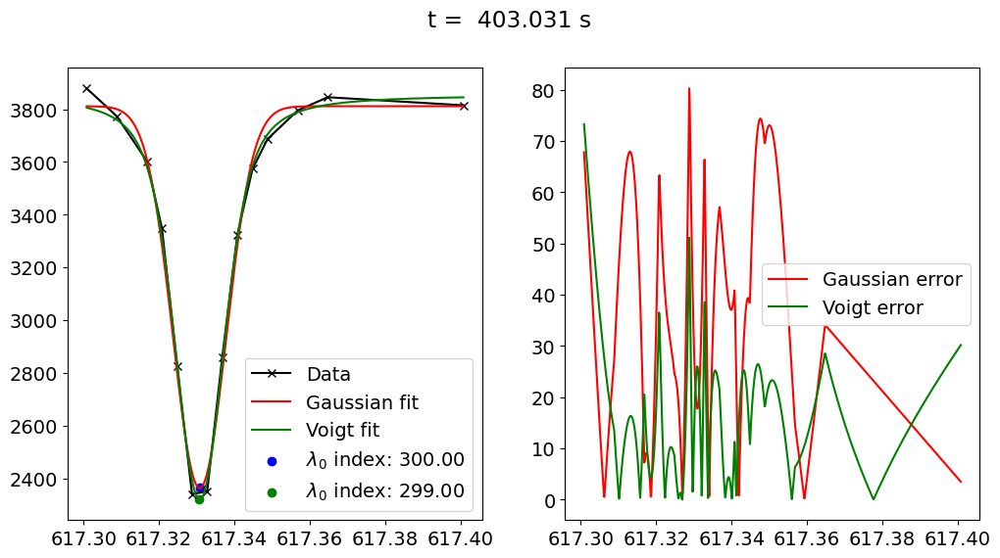

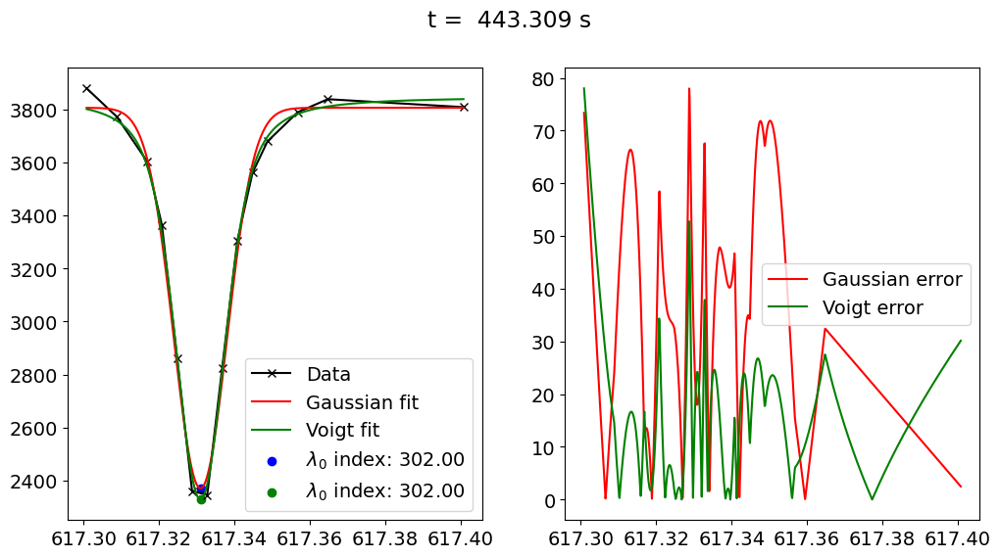

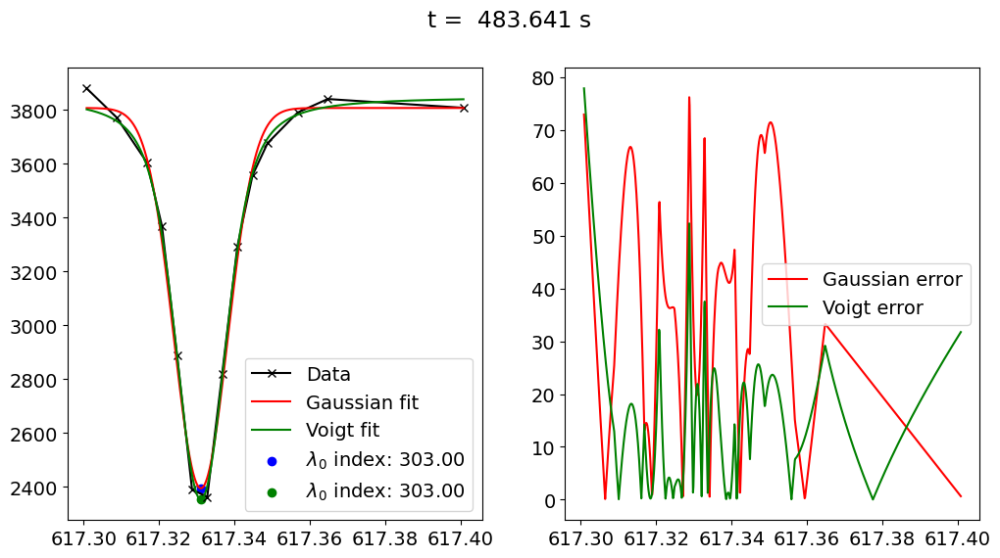

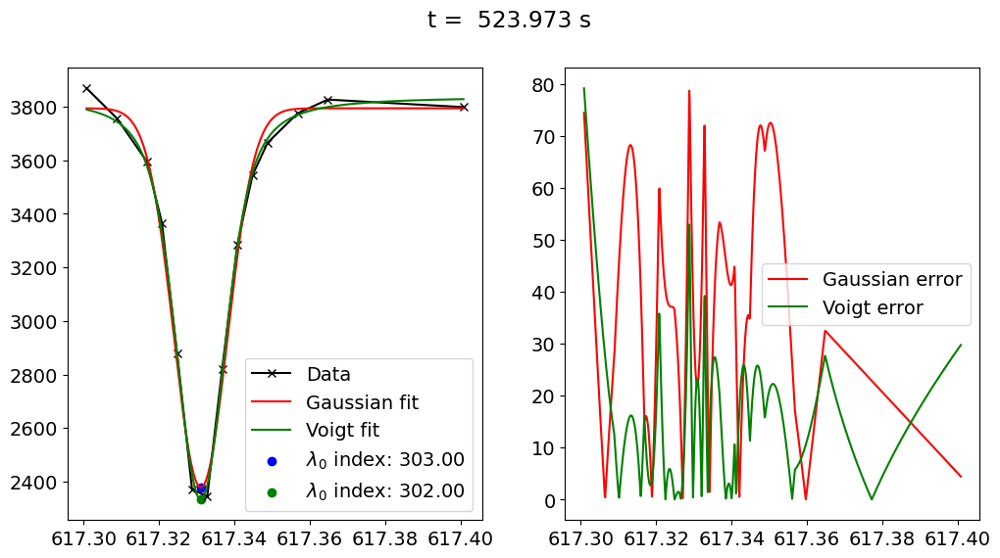

...

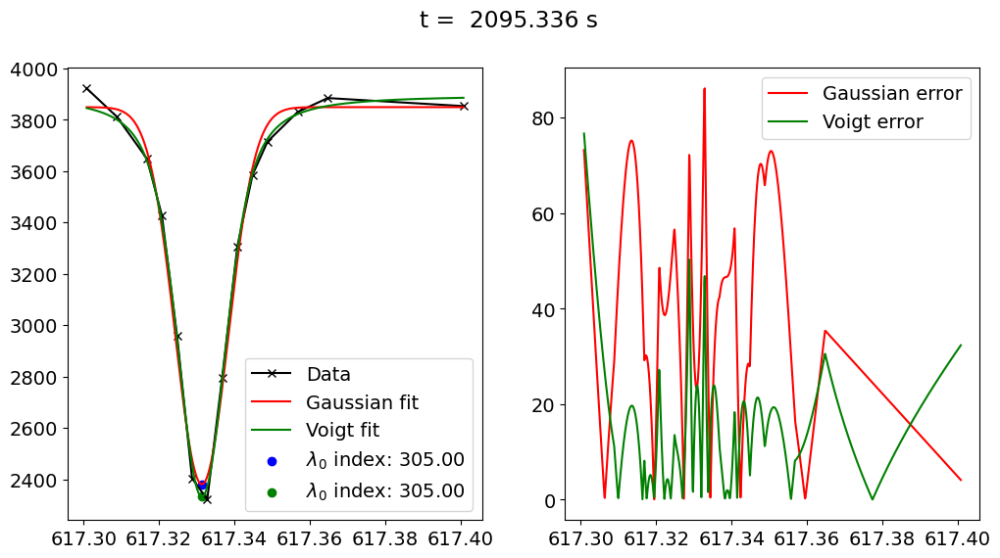

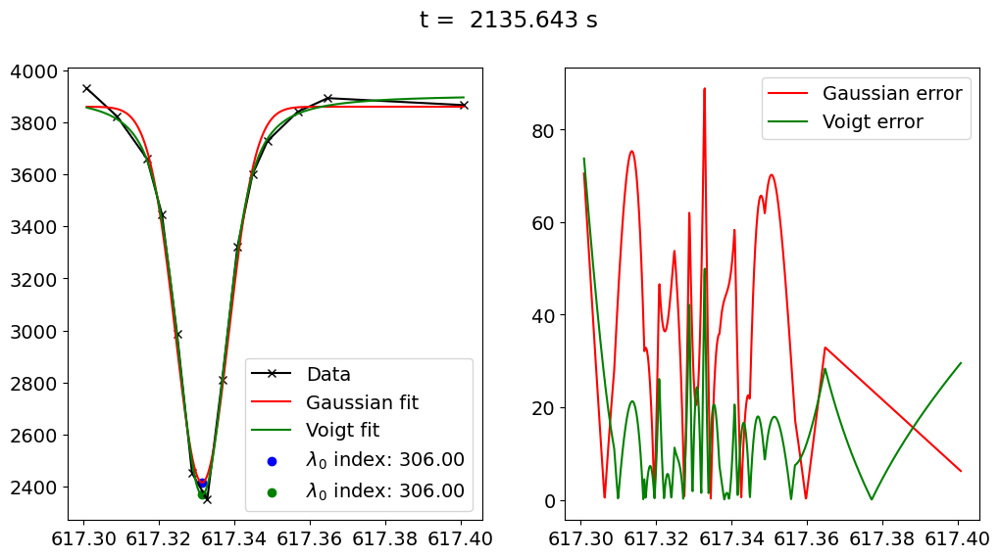

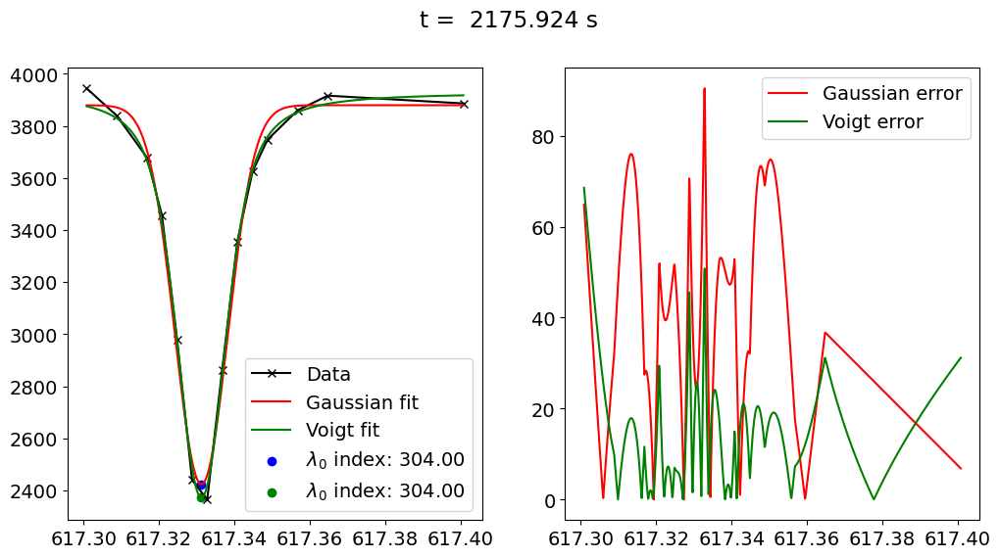

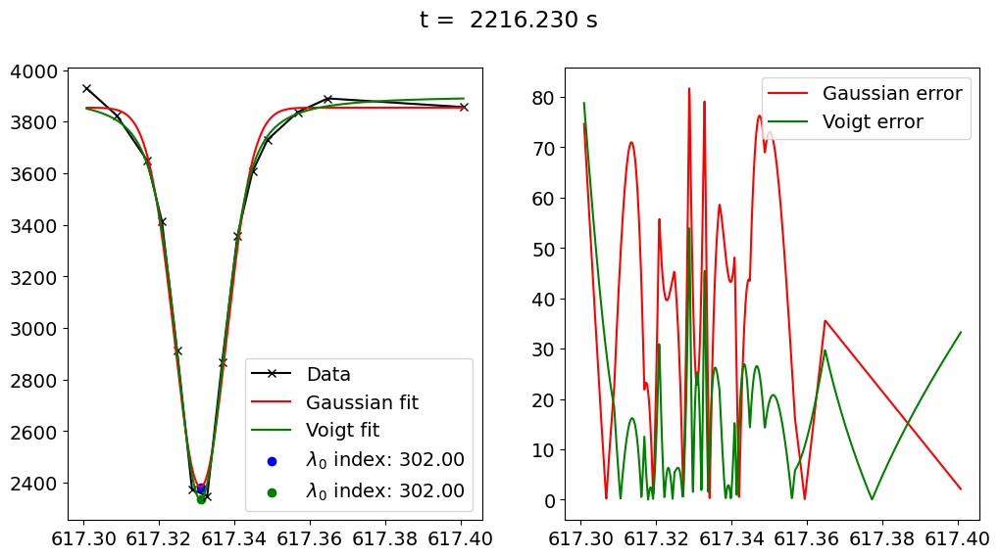

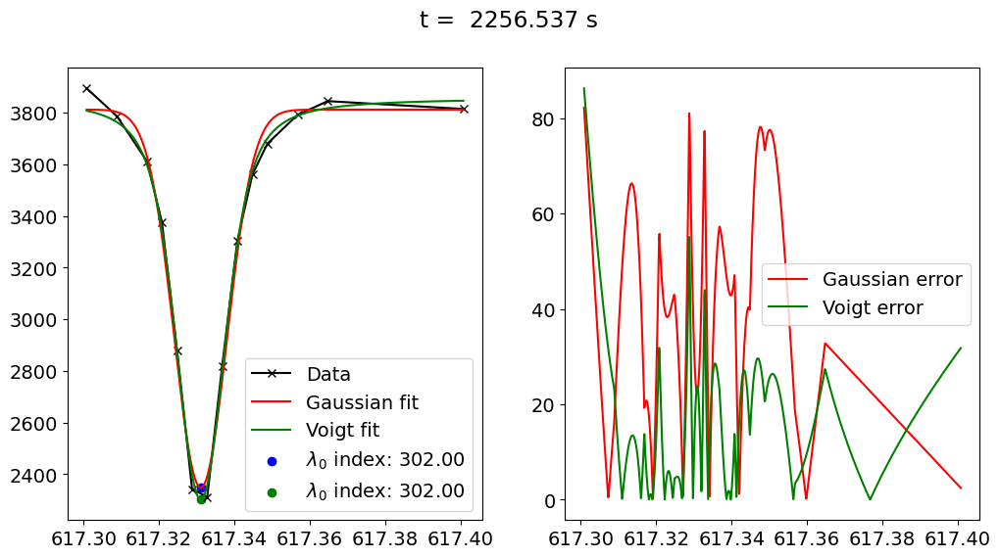

In [36]:
spat_avg_i_gauss = np.zeros((time.size, nump))
spat_avg_i_voigt = np.zeros((time.size, nump))
for t in range(time.size):
    y_data = np.average(subfield_1[t, :], axis = (1, 2))

    # Create the interpolator using linear interpolation
    interpolator = interp1d(x_data, y_data, kind='linear')

    # Use the interpolator to compute y values at new x points
    y_interpolated = interpolator(x_interpolated)

    # Parameters for curve fit
    background_level_guess = np.max(y_data)                             # Baseline level
    amplitude_guess = - (np.max(y_data) - np.min(y_data))    # Dip depth
    mean_guess = np.mean(wavelength)                                               # Center of the dip

    # Find FWHM
    peak_max = np.max(y_data) - np.min(y_data)
    half_max = peak_max / 2 + np.min(y_data)
    thr = 15
    indices = np.logical_and(y_interpolated > half_max - thr, y_interpolated < half_max + thr)
    search = np.where(indices == True)[0]
    if search.size < 2:
        print("No FWHM found")
        continue
    fwhm = x_interpolated[search[-1]] - x_interpolated[search[0]]
    sigma_guess =  fwhm       # Width of the Gaussian component
    gamma_guess = sigma_guess

    # gaussian
    initial_guesses_gauss = [amplitude_guess, mean_guess, sigma_guess, background_level_guess]
    popt_gauss, pcov_gauss = curve_fit(_gaussian, x_interpolated, y_interpolated, p0=initial_guesses_gauss, maxfev=5000)
    spat_avg_i_gauss[t] = _gaussian(x_interpolated, *popt_gauss)

    # voigt
    initial_guesses_voigt = [amplitude_guess, mean_guess, sigma_guess, gamma_guess, background_level_guess]
    popt_voigt, pcov_voigt = curve_fit(_voigt, x_interpolated, y_interpolated, p0=initial_guesses_voigt, maxfev=5000)
    spat_avg_i_voigt[t] = _voigt(x_interpolated, *popt_voigt)

    I_min_gauss_idx = np.argmin(_gaussian(x_interpolated, *popt_gauss))
    I_min_voigt_idx = np.argmin(_voigt(x_interpolated, *popt_voigt))
    I_min_gauss = x_interpolated[I_min_gauss_idx]
    I_min_voigt = x_interpolated[I_min_voigt_idx]

    abs_err_gauss = np.abs( _gaussian(x_interpolated, *popt_gauss) - y_interpolated )
    abs_err_voigt = np.abs( _voigt(x_interpolated, *popt_voigt) - y_interpolated )

    fig, ax = plt.subplots(1, 2, figsize = (12, 6))
    ax[0].plot(x_data, y_data, 'kx-', label='Data')
    ax[0].plot(x_interpolated, _gaussian(x_interpolated, *popt_gauss), 'r-', label=f'Gaussian fit')
    ax[0].plot(x_interpolated, _voigt(x_interpolated, *popt_voigt), 'g-', label=f'Voigt fit')
    ax[0].scatter(I_min_gauss, np.min(_gaussian(x_interpolated, *popt_gauss)), color = "blue", label = f"$\lambda_0$ index: {I_min_gauss_idx:.2f}")
    ax[0].scatter(I_min_voigt, np.min(_voigt(x_interpolated, *popt_voigt)), color = "green", label = f"$\lambda_0$ index: {I_min_voigt_idx:.2f}")
    ax[0].legend()

    ax[1].plot(x_interpolated, abs_err_gauss, 'r-', label='Gaussian error')
    ax[1].plot(x_interpolated, abs_err_voigt, 'g-', label='Voigt error')
    ax[1].legend()

    fig.suptitle(f"t = {time_s[t]: .3f} s")
    plt.show()

## Error analysis

In [37]:
import time

In [57]:
t0_voigt = time.time()
for t in range(len(time_s)):
    avg_intensity = np.average(subfield_1[t, :], axis = (1, 2))
    x_voigt, y_voigt = _fit_voigt(wavelength, avg_intensity, 1000, 20)
t1_voigt = time.time()
print(f"Voigt time: {t1_voigt - t0_voigt}")

/tmp/ipykernel_4013085/2255937726.py:4: RuntimeWarning: overflow encountered in multiply
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background
/tmp/ipykernel_4013085/2255937726.py:4: RuntimeWarning: overflow encountered in divide
  return amplitude * np.real(wofz(z)) / (sigma * np.sqrt(2 * np.pi)) + background


Voigt time: 1.1923227310180664


In [58]:
t0_gauss = time.time()
for t in range(len(time_s)):
    avg_intensity = np.average(subfield_1[t, :], axis = (1, 2))
    x_gauss, y_gauss = _fit_gaussian(wavelength, avg_intensity, 1000, 20)
t1_gauss = time.time()
print(f"Gauss time: {t1_gauss - t0_gauss}")

Gauss time: 0.12705397605895996
